<h1 style="text-align:center">📈 تحليل أسعار الأسهم واتجاهات السوق 📊</h1>


<P style="text-align:center"> ما مصدر البيانات؟ 📊</P>

<Pre style="text-align:center">
البيانات: مجموعة جاهزة بعد التنقيب والمعالجة. -📊
   لاستخراج البيانات من الموقع.beautifulsoupاستخدام-🕵️ 
 الشركات: الـ 40 شركة في مؤشر CAC40 الفرنسي.- 🏢
 الفترة: 10 سنوات (2010–2020).- 📅
</Pre>

<style>
    body, html {
        height: 100%;
        font-family: Arial, sans-serif;
        direction: rtl;
        color: black;
        display: flex;
        justify-content: center;
        apgn-items: center;
        margin: 0;
    }

    h2 {
        text-align: center;
    }

    ul {
        list-style-type: none;
        padding: 0;
        text-align: center;
    }

    li {
        background: #ecf0f1;
        margin: 10px 0;
        padding: 10px;
        border-radius: 5px;
        font-size: 18px;
        color: black;
    }
</style>

<h2>الأسئلة التي سوف يجيب عنها التحليل تحليل سوق الأسهم 📊</h2>
<ul>
    <li>كيف تغير سعر الإغلاق بمرور الوقت لكل سهم؟ (رسم بياني لسعر الإغلاق لكل شركة عبر الزمن) 📈</li>
    <li>ما الاتجاه العام لسوق الأسهم (CAC40) خلال الفترة الزمنية المتاحة؟ (تحليل الاتجاهات العامة) 📉</li>
    <li>ما هي الشركات التي شهدت أكبر تقلبات في الأسعار خلال الفترة الزمنية؟ (قياس التغيرات اليومية والتقلبات) 🔄</li>
    <li>ما العلاقة بين حجم التداول وسعر الإغلاق؟ (تحليل العلاقة بين "Volume" و "Closing_Price") 📊</li>
    <li>📆هل هناك نمط موسمي في أداء الأسهم؟ (تحليل شهري أو موسمي للأسعار) 📆</li>
    <li>ما أفضل وأسوَأ الفترات الزمنية أداءً لكل شركة؟ (تحليل أداء الأسهم في أوقات محددة) 🏆</li>
    <li>هل يوجد تأثير لأيام الأسبوع على تغيرات أسعار الأسهم؟ (مقارنة أداء الأسهم بين أيام الأسبوع) 📅</li>
    <li>كيف تأثرت الأسهم بالأحداث الاقتصادية الكبرى خلال الفترة الزمنية؟ (مقارنة الأسعار قبل وبعد الأحداث المهمة) 🌍</li>
    <li>ما معدل العائد اليومي لكل سهم؟ (حساب العائد اليومي وتحليل توزيعه) 💰</li>
    <li>هل هناك علاقة بين الشركات المختلفة في تغيرات أسعارها؟ (تحليل الارتباط بين أسعار الشركات المختلفة) 🔗</li>
</ul>


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.metrics import mean_absolute_error
import statsmodels.api as sm
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA


<h2 style="text-align:center"> الاستكشاف والتنظيف <h2>

In [23]:
df = pd.read_csv('preprocessed_CAC40.csv')
df.head()

,Unnamed: 0,Name,Date,Open,Closing_Price,Daily_High,Daily_Low,Volume
0,0,Accor,2020-04-03,22.99,23.40,23.40,22.99,67
1,1,Accor,2020-04-02,23.91,22.99,23.91,22.99,250
2,2,Accor,2020-04-01,24.10,23.83,24.10,23.83,37
3,3,Accor,2020-03-31,25.04,25.00,25.24,24.99,336
4,4,Accor,2020-03-30,26.50,25.02,26.50,24.99,415


In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97648 entries, 0 to 97647
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     97648 non-null  int64  
 1   Name           97648 non-null  object 
 2   Date           97648 non-null  object 
 3   Open           97418 non-null  float64
 4   Closing_Price  97646 non-null  float64
 5   Daily_High     97444 non-null  float64
 6   Daily_Low      97444 non-null  float64
 7   Volume         77195 non-null  object 
dtypes: float64(4), int64(1), object(3)
memory usage: 6.0+ MB


In [25]:
print("nunique values")
df.nunique()

nunique values


Unnamed: 0       97648
Name                38
Date              2601
Open             18938
Closing_Price    18354
Daily_High       18480
Daily_Low        18435
Volume           15774
dtype: int64

In [26]:
df.describe()

,Unnamed: 0,Open,Closing_Price,Daily_High,Daily_Low
count,97648.00000,97418.000000,97646.000000,97444.000000,97444.000000
mean,48823.50000,68.737224,68.823124,69.145090,68.357316
std,28188.69388,77.246790,77.267756,77.646032,76.866258
min,0.00000,3.370000,3.370000,3.410000,3.350000
25%,24411.75000,24.810000,24.840000,24.960000,24.650000
50%,48823.50000,46.880000,46.980000,47.160000,46.640000
75%,73235.25000,81.717500,81.860000,82.220000,81.262500
max,97647.00000,724.000000,724.000000,724.000000,718.000000


In [27]:
df.columns

Index(['Unnamed: 0', 'Name', 'Date', 'Open', 'Closing_Price', 'Daily_High',
       'Daily_Low', 'Volume'],
      dtype='object')

In [28]:
df['Date']=pd.to_datetime(df['Date'])

df['Date'].head()

0   2020-04-03
1   2020-04-02
2   2020-04-01
3   2020-03-31
4   2020-03-30
Name: Date, dtype: datetime64[ns]

In [29]:
df = df.sort_values(by=["Name", "Date"])

df["Date"].head()

15600   2010-01-04
15599   2010-01-05
15598   2010-01-06
15597   2010-01-07
15596   2010-01-08
Name: Date, dtype: datetime64[ns]

In [30]:
df.shape

(97648, 8)

In [31]:
missing = df.isnull().sum()
print('Missing values : \n',missing)

Missing values : 
 Unnamed: 0           0
Name                 0
Date                 0
Open               230
Closing_Price        2
Daily_High         204
Daily_Low          204
Volume           20453
dtype: int64


In [32]:
avg_missing = df.isnull().sum()/df.shape[0]*100
print('Average of missing values :\n ',avg_missing)

Average of missing values :
  Unnamed: 0        0.000000
Name              0.000000
Date              0.000000
Open              0.235540
Closing_Price     0.002048
Daily_High        0.208914
Daily_Low         0.208914
Volume           20.945641
dtype: float64


In [33]:
df=df.dropna()
df.shape

(77167, 8)

In [34]:
df.isnull().sum()

Unnamed: 0       0
Name             0
Date             0
Open             0
Closing_Price    0
Daily_High       0
Daily_Low        0
Volume           0
dtype: int64

In [35]:
Duplicated = df.duplicated().sum()
print('Duplicated values : ',Duplicated)

Duplicated values :  0


In [36]:
Companies = df["Name"].nunique()

print('Number of companies : ',Companies)

Number of companies :  38


In [37]:
print('Names of companies : \n',df["Name"].unique())

Names of companies : 
 ['AXA' 'Accor' 'Air Liquide' 'Airbus ' 'ArcelorMittal' 'Atos'
 'BNP Paribas' 'Bouygues' 'Cap Gemini' 'Crédit Agricole' 'Danone'
 'Dassault Systèmes' 'Engie (ex GDF Suez' 'EssilorLuxottica'
 'Hermès (Hermes International' 'Kering' 'LEGRAND' 'LOréal'
 'LVMH Moet Hennessy Louis Vuitton'
 'Michelin (Compagnie Générale d Etablissements Michelin SCPA' 'Orange'
 'Pernod Ricard' 'Peugeot' 'Publicis' 'Renault' 'SAFRAN'
 'STMicroelectronics' 'Saint-Gobain' 'Sanofi' 'Schneider Electric'
 'Société Générale (Societe Generale' 'Sodexo' 'TOTAL' 'Unibail-Rodamco'
 'VINCI' 'Veolia Environnement' 'Vivendi' 'Worldline SA']


In [38]:
df["Name"] = df["Name"].str.strip()  
df["Name"] = df["Name"].str.replace(r"[()]", "", regex=True) 
df["Name"] = df["Name"].str.replace("Hermès International", "Hermès", regex=False)
df["Name"] = df["Name"].str.replace("Michelin.*", "Michelin", regex=True)  
df["Name"] = df["Name"].str.replace("Société Générale.*", "Société Générale", regex=True)

print(df["Name"].unique())

['AXA' 'Accor' 'Air Liquide' 'Airbus' 'ArcelorMittal' 'Atos' 'BNP Paribas'
 'Bouygues' 'Cap Gemini' 'Crédit Agricole' 'Danone' 'Dassault Systèmes'
 'Engie ex GDF Suez' 'EssilorLuxottica' 'Hermès Hermes International'
 'Kering' 'LEGRAND' 'LOréal' 'LVMH Moet Hennessy Louis Vuitton' 'Michelin'
 'Orange' 'Pernod Ricard' 'Peugeot' 'Publicis' 'Renault' 'SAFRAN'
 'STMicroelectronics' 'Saint-Gobain' 'Sanofi' 'Schneider Electric'
 'Société Générale' 'Sodexo' 'TOTAL' 'Unibail-Rodamco' 'VINCI'
 'Veolia Environnement' 'Vivendi' 'Worldline SA']


In [39]:
print('Number of companies : ',df["Name"].nunique())

Number of companies :  38


In [40]:
company_counts = df.groupby("Name")["Date"].count().reset_index()

unique_companies = company_counts["Name"].unique()
colors = {company: px.colors.qualitative.Set1[i % len(px.colors.qualitative.Set1)] for i, company in enumerate(unique_companies)}

fig = px.bar(company_counts, x="Name", y="Date", 
             title="Available Days per Company", 
             labels={"Date": "Number of Days", "Name": "Company Name"},
             text_auto=True, 
             color="Name", 
             color_discrete_map=colors)

fig.update_layout(xaxis_tickangle=-45, title_x=0.5)

fig.show()


In [105]:
fig = px.line(df, x="Date", y="Closing_Price", color="Name", 
              title="Closing Price Trends Over Time", 
              labels={"Date": "Date", "Closing_Price": "Closing Price", "Name": "Company Name"})

fig.update_layout(
    xaxis_title="Date",
    yaxis_title="Closing Price",
    title_x=0.5, 
    legend_title="Company Name"
)

fig.show()

In [84]:


if 'Unnamed: 0' in df.columns:
    df.drop(columns=['Unnamed: 0'], inplace=True)


df['Volume'] = pd.to_numeric(df['Volume'], errors='coerce')


df['Daily_Change'] = df['Daily_High'] - df['Daily_Low']


<p style="text-align: center">كيف تغير سعر الإغلاق بمرور الوقت لكل سهم؟ (رسم بياني لسعر الإغلاق لكل شركة عبر الزمن) 📈</p>

In [106]:
# 1. Change in closing price for each company over time
fig1 = px.line(df, x='Date', y='Closing_Price', color='Name', title='Change in Closing Price for Each Company Over Time')
fig1.show()


<p style="text-align: center">ما الاتجاه العام لسوق الأسهم (CAC40) خلال الفترة الزمنية المتاحة؟ (تحليل الاتجاهات العامة) 📉</p>

In [107]:
# 2. General trend of the CAC40 market
market_trend = df.groupby('Date')['Closing_Price'].mean().reset_index()
fig2 = px.line(market_trend, x='Date', y='Closing_Price', title='General Trend of the CAC40 Market Over Time')
fig2.show()



<p style="text-align: center">ما هي الشركات التي شهدت أكبر تقلبات في الأسعار خلال الفترة الزمنية؟ (قياس التغيرات اليومية والتقلبات) 🔄</p>


In [88]:
# 3. Companies with the largest price fluctuations
volatility = df.groupby('Name')['Daily_Change'].mean().reset_index()
fig3 = px.bar(volatility, x='Name', y='Daily_Change', title='Average Daily Volatility for Each Company')
fig3.show()



<p style="text-align: center">ما العلاقة بين حجم التداول وسعر الإغلاق؟ (تحليل العلاقة بين "Volume" و "Closing_Price") 📊</p>


In [108]:
# 4. Relationship between trading volume and closing price
fig4 = px.scatter(df, x='Volume', y='Closing_Price', color='Name', title='Relationship Between Trading Volume and Closing Price')
fig4.show()



<p style="text-align: center">📆هل هناك نمط موسمي في أداء الأسهم؟ (تحليل شهري أو موسمي للأسعار) 📆</p>

In [90]:
# 5. Seasonal analysis of stock performance
df['Month'] = df['Date'].dt.month
monthly_trend = df.groupby('Month')['Closing_Price'].mean().reset_index()
fig5 = px.line(monthly_trend, x='Month', y='Closing_Price', title='Seasonal Trend of Stock Prices')
fig5.show()




<p style="text-align: center">ما أفضل وأسوَأ الفترات الزمنية أداءً لكل شركة؟ (تحليل أداء الأسهم في أوقات محددة) 🏆</p>


In [91]:
# 6. Best and worst performing periods for each company
best_worst = df.groupby('Name')['Closing_Price'].agg(['max', 'min']).reset_index()
print(best_worst)



                                Name     max    min
0                                AXA   27.50   8.20
1                              Accor   48.81  16.07
2                        Air Liquide  141.35  46.79
3                             Airbus  138.80  13.53
4                      ArcelorMittal   76.88   6.28
5                               Atos   98.10  21.72
6                        BNP Paribas   69.00  22.81
7                           Bouygues   45.57  16.79
8                         Cap Gemini  118.95  22.61
9                    Crédit Agricole   32.09  11.76
10                            Danone   81.88  36.87
11                 Dassault Systèmes  161.30  18.98
12                 Engie ex GDF Suez   30.58   8.77
13                  EssilorLuxottica  144.45  40.54
14       Hermès Hermes International  724.00  94.94
15                            Kering  612.00  66.77
16                           LEGRAND   77.34  20.12
17                            LOréal  280.00  70.48
18  LVMH Moe

<p style="text-align: center">هل يوجد تأثير لأيام الأسبوع على تغيرات أسعار الأسهم؟ (مقارنة أداء الأسهم بين أيام الأسبوع) 📅</p>

In [92]:
# 7. Effect of weekdays on stock prices
df['Weekday'] = df['Date'].dt.day_name()
weekday_trend = df.groupby('Weekday')['Closing_Price'].mean().reset_index()
fig7 = px.bar(weekday_trend, x='Weekday', y='Closing_Price', title='Effect of Weekdays on Stock Prices')
fig7.show()



<p style="text-align: center">كيف تأثرت الأسهم بالأحداث الاقتصادية الكبرى خلال الفترة الزمنية؟ (مقارنة الأسعار قبل وبعد الأحداث المهمة) 🌍</p>


In [93]:
# 8. Impact of economic events on stocks (dates entered manually for analysis)
event_dates = ['2020-03-16', '2020-06-01']  # Examples
for event in event_dates:
    df_event = df[df['Date'] == event]
    print(f"Impact of event on {event}:\n", df_event[['Name', 'Closing_Price']])

Impact of event on 2020-03-16:
                                    Name  Closing_Price
13014                               AXA          13.39
14                                Accor          21.57
2612                        Air Liquide          98.86
5212                             Airbus          68.14
7813                      ArcelorMittal           7.19
10414                              Atos          48.32
15614                       BNP Paribas          27.16
18214                          Bouygues          23.74
20807                        Cap Gemini          60.52
23408                   Crédit Agricole          12.78
26008                            Danone          53.36
28609                 Dassault Systèmes         108.25
31209                 Engie ex GDF Suez           9.76
33808                  EssilorLuxottica          95.48
36408       Hermès Hermes International         547.00
39007                            Kering         367.00
41608                           L

<p style="text-align: center">ما معدل العائد اليومي لكل سهم؟ (حساب العائد اليومي وتحليل توزيعه) 💰</p>


In [94]:
# 9. Calculate daily return for each stock
df['Daily_Return'] = df.groupby('Name')['Closing_Price'].pct_change()
avg_return = df.groupby('Name')['Daily_Return'].mean().reset_index()
fig9 = px.bar(avg_return, x='Name', y='Daily_Return', title='Average Daily Return for Each Stock')
fig9.show()

<p style="text-align: center">هل هناك علاقة بين الشركات المختلفة في تغيرات أسعارها؟ (تحليل الارتباط بين أسعار الشركات المختلفة) 🔗</p>

In [95]:
# 10. Analysis of relationships between companies
correlation_matrix = df.pivot(index='Date', columns='Name', values='Closing_Price').corr()
fig10 = px.imshow(correlation_matrix, title='Correlation Matrix Between Companies')
fig10.show()

<style>
    body, html {
        height: 100%;
        font-family: Arial, sans-serif;
        direction: rtl;
        color: black;
        display: flex;
        justify-content: center;
        align-items: center;
        margin: 0;
    }

    h2 {
        text-align: right;
    }

    ul {
        list-style-type: none;
        padding: 0;
        text-align: right;
    }

    li {
        background: #ecf0f1;
        margin: 10px 0;
        padding: 10px;
        border-radius: 5px;
        font-size: 18px;
        color: black;
    }
</style>

<h2>Air Liquide تحليل اسهم شركة 📊</h2>
<ul>
    <li>ما هو أعلى وأدنى سعر إغلاق للشركة خلال فترة معينة؟ 💹</li>
    <li>ما هو متوسط سعر الإغلاق للشركة خلال فترة زمنية محددة؟ 📉</li>
    <li>ما هو أعلى وأدنى تغير يومي في الأسعار للشركة؟ 🔼🔽</li>
    <li>ما هو العائد اليومي المتوسط للشركة؟ 💰</li>
    <li>ما هو الاتجاه الشهري لأسعار إغلاق الشركة؟ 📅📈</li>
    <li>كيف يقارن العائد اليومي للشركة مع السوق (CAC40)؟ 📊📉</li>
    <li>ما هو إجمالي حجم التداول للشركة خلال فترة معينة؟ 📦</li>
    <li>ما هو أداء الشركة خلال أحداث معينة (مثل الأحداث الاقتصادية)؟ 🌍📊</li>
    <li>ما هي التقلبات (التغير اليومي المتوسط) للشركة؟ 🔄</li>
    <li>ما هو أداء الشركة في أيام الأسبوع المختلفة؟ 📆📅</li>
</ul>


<p style="text-align: center">ما هو أعلى وأدنى سعر إغلاق للشركة خلال فترة معينة؟ 💹</p>

In [79]:
company_name = 'Air Liquide'  # Replace with the actual company name

# Filter data for the specific period
specific_period_data = df[(df['Name'] == company_name) & (df['Date'] >= '2015-01-01')]  # For example, from Jan 2024 onwards

# Highest and lowest closing price
highest_closing = specific_period_data['Closing_Price'].max()
lowest_closing = specific_period_data['Closing_Price'].min()
print(f"Highest and lowest closing prices for {company_name} in the specified period:\n", highest_closing, lowest_closing)


Highest and lowest closing prices for Air Liquide in the specified period:
 141.35 71.64


<p style="text-align: center">ما هو متوسط سعر الإغلاق للشركة خلال فترة زمنية محددة؟ 📉</p>

In [80]:

# Filter data for the specific period
specific_period_data = df[(df['Name'] == company_name) & (df['Date'] >= '2018-01-01')]  # Example period

# Average closing price
average_closing = specific_period_data['Closing_Price'].mean()
print(f"Average closing price for {company_name} in the specified period: {average_closing}")


Average closing price for Air Liquide in the specified period: 105.84158088235293


<p style="text-align: center">ما هو أعلى وأدنى تغير يومي في الأسعار للشركة؟ 🔼🔽</p>

In [96]:


# Calculate daily price change
company_data = df[df['Name'] == company_name]
company_data['Daily_Change'] = company_data['Daily_High'] - company_data['Daily_Low']

# Highest and lowest daily change
max_daily_change = company_data['Daily_Change'].max()
min_daily_change = company_data['Daily_Change'].min()
print(f"Highest and lowest daily price change for {company_name}: {max_daily_change}, {min_daily_change}")

# Plot the daily price change for visualization
fig = px.line(company_data, x='Date', y='Daily_Change', title=f"Daily Price Change for {company_name}")
fig.add_scatter(x=company_data['Date'], y=[max_daily_change]*len(company_data), mode='lines', name='Max Daily Change', line=dict(dash='dash', color='red'))
fig.add_scatter(x=company_data['Date'], y=[min_daily_change]*len(company_data), mode='lines', name='Min Daily Change', line=dict(dash='dash', color='blue'))

fig.show()


Highest and lowest daily price change for Air Liquide: 10.159999999999997, 0.0


C:\Users\ahmed\AppData\Local\Temp\ipykernel_2900\1965378267.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<p style="text-align: center">ما هو العائد اليومي المتوسط للشركة؟ 💰</p>

In [98]:


# Calculate daily return
company_data = df[df['Name'] == company_name]
company_data['Daily_Return'] = company_data['Closing_Price'].pct_change()

# Average daily return
avg_daily_return = company_data['Daily_Return'].mean()
print(f"Average daily return for {company_name}: {avg_daily_return}")

# Plot the daily return for visualization
fig = px.line(company_data, x='Date', y='Daily_Return', title=f"Daily Return for {company_name}")

# Add a line for average daily return
fig.add_hline(y=avg_daily_return, line=dict(dash='dash', color='red'), annotation_text="Average Daily Return", annotation_position="top right")

fig.show()


Average daily return for Air Liquide: 0.00041066740645800796


C:\Users\ahmed\AppData\Local\Temp\ipykernel_2900\1056438112.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<p style="text-align: center">ما هو الاتجاه الشهري لأسعار إغلاق الشركة؟ 📅📈</p>

In [97]:

# Add month column
company_data = df[df['Name'] == company_name]
company_data['Month'] = company_data['Date'].dt.month

# Calculate monthly trend
monthly_trend = company_data.groupby('Month')['Closing_Price'].mean().reset_index()
fig = px.line(monthly_trend, x='Month', y='Closing_Price', title=f"Monthly closing price trend for {company_name}")
fig.show()


C:\Users\ahmed\AppData\Local\Temp\ipykernel_2900\2982037621.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<p style="text-align: center">كيف يقارن العائد اليومي للشركة مع السوق (CAC40)؟ 📊📉</p>

In [99]:

# Calculate the market daily return (mean of the market)
market_trend = df.groupby('Date')['Closing_Price'].mean().reset_index()
company_data = df[df['Name'] == company_name]

# Calculate daily return for the company and market
company_data['Company_Daily_Return'] = company_data['Closing_Price'].pct_change()
market_trend['Market_Daily_Return'] = market_trend['Closing_Price'].pct_change()

# Merge data and compare
comparison_data = pd.merge(company_data, market_trend, on='Date', how='inner')
fig = px.scatter(comparison_data, x='Market_Daily_Return', y='Company_Daily_Return', title=f"Daily return of {company_name} vs Market")
fig.show()


C:\Users\ahmed\AppData\Local\Temp\ipykernel_2900\1207589655.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<p style="text-align: center">ما هو إجمالي حجم التداول للشركة خلال فترة معينة؟ 📦</p>

In [100]:

# Filter data for the specific period
specific_period_data = df[(df['Name'] == company_name) & (df['Date'] >= '2014-01-01')]  # Example period

# Total volume traded
total_volume = specific_period_data['Volume'].sum()
print(f"Total volume traded by {company_name} during the specified period: {total_volume}")


Total volume traded by Air Liquide during the specified period: 417794.0


<p style="text-align: center">ما هو أداء الشركة خلال أحداث معينة (مثل الأحداث الاقتصادية)؟ 🌍📊</p>

In [101]:

# Define event dates
event_dates = ['2020-03-16', '2020-06-01']  # Example event dates

for event in event_dates:
    event_data = df[(df['Name'] == company_name) & (df['Date'] == event)]
    print(f"Performance of {company_name} during the event on {event}:")
    print(event_data[['Date', 'Closing_Price']])


Performance of Air Liquide during the event on 2020-03-16:
           Date  Closing_Price
2612 2020-03-16          98.86
Performance of Air Liquide during the event on 2020-06-01:
Empty DataFrame
Columns: [Date, Closing_Price]
Index: []


<p style="text-align: center">ما هي التقلبات (التغير اليومي المتوسط) للشركة؟ 🔄</p>

In [102]:

# Calculate volatility (average daily change)
company_data = df[df['Name'] == company_name]
company_data['Daily_Change'] = company_data['Daily_High'] - company_data['Daily_Low']

# Average volatility
average_volatility = company_data['Daily_Change'].mean()
print(f"Average volatility for {company_name}: {average_volatility}")

# Plot the daily volatility for visualization
fig = px.line(company_data, x='Date', y='Daily_Change', title=f"Daily Volatility for {company_name}")

# Add a line for average volatility
fig.add_hline(y=average_volatility, line=dict(dash='dash', color='red'), annotation_text="Average Volatility", annotation_position="top right")

fig.show()


Average volatility for Air Liquide: 0.8976348884381339


C:\Users\ahmed\AppData\Local\Temp\ipykernel_2900\3605801650.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<p style="text-align: center">ما هو أداء الشركة في أيام الأسبوع المختلفة؟ 📆📅</p>

In [103]:

# Add weekday column
company_data = df[df['Name'] == company_name]
company_data['Weekday'] = company_data['Date'].dt.day_name()

# Calculate average closing price by weekday
weekday_trend = company_data.groupby('Weekday')['Closing_Price'].mean().reset_index()
fig = px.bar(weekday_trend, x='Weekday', y='Closing_Price', title=f"Performance of {company_name} on different weekdays")
fig.show()


C:\Users\ahmed\AppData\Local\Temp\ipykernel_2900\4204632591.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<h2 style="text-align:center"> ARIMA <h2>

c:\Users\ahmed\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

c:\Users\ahmed\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

c:\Users\ahmed\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

c:\Users\ahmed\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

c:\

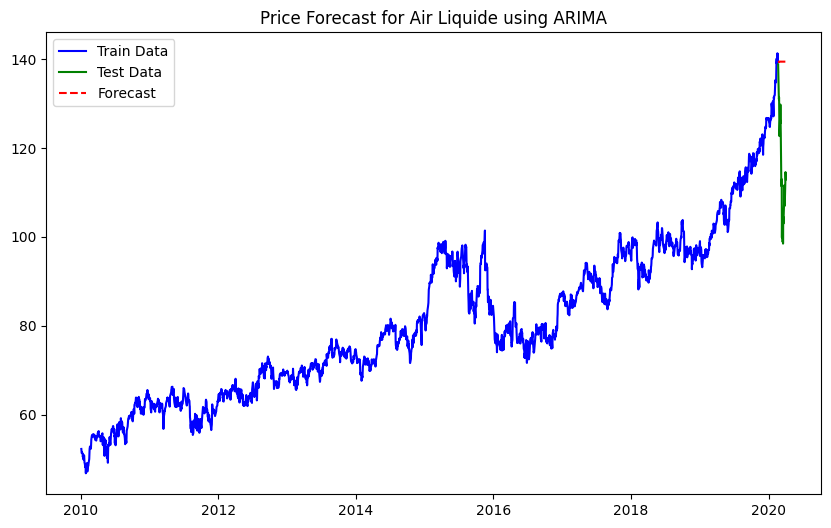

Predicted closing prices for the next 30 days: 
 2435    139.338106
2436    139.419770
2437    139.379890
2438    139.483313
2439    139.472956
2440    139.468322
2441    139.469070
2442    139.463392
2443    139.464454
2444    139.464711
2445    139.464745
2446    139.465042
2447    139.464955
2448    139.464942
2449    139.464936
2450    139.464922
2451    139.464928
2452    139.464929
2453    139.464929
2454    139.464930
2455    139.464929
2456    139.464929
2457    139.464929
2458    139.464929
2459    139.464929
2460    139.464929
2461    139.464929
2462    139.464929
2463    139.464929
2464    139.464929
Name: predicted_mean, dtype: float64


In [104]:



company_name = 'Air Liquide'  

company_data = df[df['Name'] == company_name]


company_data.set_index('Date', inplace=True)

closing_prices = company_data['Closing_Price']

closing_prices = closing_prices.dropna()

train_data = closing_prices[:-30]
test_data = closing_prices[-30:]


model = ARIMA(train_data, order=(5, 1, 0))  
model_fit = model.fit()

forecast = model_fit.forecast(steps=30)  

plt.figure(figsize=(10,6))
plt.plot(train_data.index, train_data, label='Train Data', color='blue')
plt.plot(test_data.index, test_data, label='Test Data', color='green')
plt.plot(test_data.index, forecast, label='Forecast', color='red', linestyle='--')
plt.title(f"Price Forecast for {company_name} using ARIMA")
plt.legend()
plt.show()

print(f"Predicted closing prices for the next 30 days: \n", forecast)


In [ ]:

mae = mean_absolute_error(test_data, forecast)
print(f"Mean Absolute Error (MAE): {mae}")


Mean Absolute Error (MAE): 23.959084429231403
